In [1]:
import fiona 
import geopandas as gpd
import seaborn as sns
import pandas as pd
import numpy as np
import geojson
import shapely
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium

# Clustering Mexico City neighborhoods

In this exercise we will classify some locations in Mexico City using venue data from the Foursquare API.

We will classfiy locations per municipality and later compare some municipalitites of Mexico City.

The geographic data was retrieved from the Mexican Postal Service website in several files.
* The file `CodigosPostales.csv` that includes all Postal Codes in Mexico City with local names, municipality name and associated Post Office ID.
* The files `CP_09CdMx_v2.kml` and `CP_09CdMx_v2.dbf` that include Polygon information per Postal Code.

All these data files can be found in https://datos.gob.mx/ 

### Loading geographic data
First let's load the Polygon geodata files with the fiona driver and geopandas.

In [2]:
#enable fiona driver
gpd.io.file.fiona.drvsupport.supported_drivers['KML'] = 'rw'

df_polygons = gpd.read_file('CP_09CdMx_v2.kml', driver='KML')

df_polygons

,Name,Description,geometry
0,,,"MULTIPOLYGON (((-99.18764 19.34674, -99.18813 ..."
1,,,"MULTIPOLYGON (((-99.19130 19.36363, -99.19109 ..."
2,,,"MULTIPOLYGON (((-99.18268 19.36235, -99.18302 ..."
3,,,"MULTIPOLYGON (((-99.17672 19.36411, -99.17510 ..."
4,,,"MULTIPOLYGON (((-99.19036 19.35190, -99.19044 ..."
...,...,...,...
1399,,,"MULTIPOLYGON (((-99.12074 19.56273, -99.12008 ..."
1400,,,"MULTIPOLYGON (((-99.12667 19.57575, -99.12616 ..."
1401,,,"MULTIPOLYGON (((-99.14468 19.56683, -99.14485 ..."
1402,,,"MULTIPOLYGON (((-99.06350 19.35371, -99.06311 ..."


In [3]:
df_codigos = gpd.read_file('CP_09CdMx_v2.dbf')

#cambiar el tipo de dato a entero y renombrar columna
df_codigos = df_codigos.astype({'d_cp':int})
df_codigos.rename(columns={'d_cp':'CP'}, inplace=True)

df_codigos

,CP,geometry
0,1000,"POLYGON ((2794650.259 819469.097, 2794601.180 ..."
1,1010,"POLYGON ((2794230.289 821325.511, 2794251.904 ..."
2,1020,"POLYGON ((2795135.993 821201.964, 2795101.712 ..."
3,1030,"POLYGON ((2795755.869 821409.304, 2795928.518 ..."
4,1040,"POLYGON ((2794354.083 820033.165, 2794347.153 ..."
...,...,...
1399,7145,"POLYGON ((2801179.677 843442.304, 2801246.360 ..."
1400,7146,"POLYGON ((2800530.596 844867.247, 2800582.255 ..."
1401,7135,"POLYGON ((2798666.405 843844.924, 2798649.205 ..."
1402,9250,"POLYGON ((2807638.791 820498.825, 2807679.700 ..."


Both dataframes have the same amount of rows with matching indexes. One has the 'Postal Code' feature but the coordinates are not the standard _latitude_ and _longitude_ while the other has the coordinates in actual _latitude_ and _longitude_ but no 'Postal Code' feature.

Let's compare some entries:

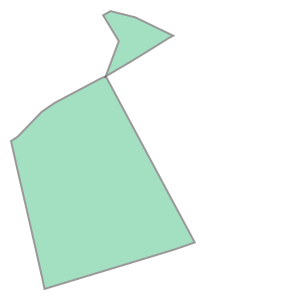

In [4]:
df_codigos['geometry'][13]

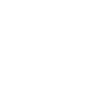

In [5]:
df_polygons['geometry'][13]

We replace the `'geometry'` column with the one with proper coordinates.

In [6]:
#df_codigos tiene coordenadas no estandar, pero df_polygons si
#remover objeto geometrico no estandar
df_geo = df_codigos.drop('geometry', axis=1)
#reemplazar con el objeto estandarizado
df_geo.insert(0, 'geometry', df_polygons['geometry'])
df_geo

,geometry,CP
0,"MULTIPOLYGON (((-99.18764 19.34674, -99.18813 ...",1000
1,"MULTIPOLYGON (((-99.19130 19.36363, -99.19109 ...",1010
2,"MULTIPOLYGON (((-99.18268 19.36235, -99.18302 ...",1020
3,"MULTIPOLYGON (((-99.17672 19.36411, -99.17510 ...",1030
4,"MULTIPOLYGON (((-99.19036 19.35190, -99.19044 ...",1040
...,...,...
1399,"MULTIPOLYGON (((-99.12074 19.56273, -99.12008 ...",7145
1400,"MULTIPOLYGON (((-99.12667 19.57575, -99.12616 ...",7146
1401,"MULTIPOLYGON (((-99.14468 19.56683, -99.14485 ...",7135
1402,"MULTIPOLYGON (((-99.06350 19.35371, -99.06311 ...",9250


We add the following features to the table: 
- `'mean_coords'`: the mean coordinates for the vertices of the Polygon objects.
- `'m_longitude'`: the mean longitude for the vertices of the Polygon objects.
- `'m_latitude'`: the mean latitude for the vertices of the Polygon objects.

In [7]:
def coordinate_mean(COORDS):
    T = len(COORDS)
    X = 0.0
    Y = 0.0
    for x,y in COORDS:
        X = X+(x/T)
        Y = Y+(y/T)
    return (X, Y)

def coordinate_means(MULTI):
    X = []
    Y = []
    for obj in MULTI:
        a, b = coordinate_mean(obj.exterior.coords)
        X.append(a)
        Y.append(b)
    return (np.mean(X), np.mean(Y))

#agregamos columnas para las coordendas medias del multipolygon y para su area
#df_geo['Area'] = df_geo['geometry'].area
df_geo['mean_coords'] = df_geo['geometry'].apply(coordinate_means)
df_geo = pd.concat([df_geo, pd.DataFrame(df_geo['mean_coords'].tolist(), columns=['m_longitude', 'm_latitude'], index=df_geo.index)], axis=1)

In [8]:
print(df_geo.shape)
df_geo.head()

(1404, 5)


,geometry,CP,mean_coords,m_longitude,m_latitude
0,"MULTIPOLYGON (((-99.18764 19.34674, -99.18813 ...",1000,"(-99.19427294521638, 19.34537966939297)",-99.194273,19.345380
1,"MULTIPOLYGON (((-99.19130 19.36363, -99.19109 ...",1010,"(-99.19391877026374, 19.36025814101851)",-99.193919,19.360258
2,"MULTIPOLYGON (((-99.18268 19.36235, -99.18302 ...",1020,"(-99.18707971749802, 19.3579354609223)",-99.187080,19.357935
3,"MULTIPOLYGON (((-99.17672 19.36411, -99.17510 ...",1030,"(-99.17940614731502, 19.35776839444836)",-99.179406,19.357768
4,"MULTIPOLYGON (((-99.19036 19.35190, -99.19044 ...",1040,"(-99.19192370834764, 19.35547883244843)",-99.191924,19.355479


In order to be able to plot the data in a map let's export it to GEOjson format.

In [9]:
#guardar los polygonos en un archivo geojson
df_geo[['CP', 'geometry']].to_file("CDMX_CP.json", driver="GeoJSON")

### Loading postal codes data

Now let's load the Postal Codes dataframe from `CodigosPostales.csv`.

In [10]:
#base de datos de los codigos postales
df_postal = pd.read_csv('CodigosPostales.csv')
print(df_postal.shape)
df_postal.head()

(1539, 7)


,Código Postal,Estado,Municipio,Ciudad,Tipo de Asentamiento,Asentamiento,Clave de Oficina
0,9350,Ciudad de México,Iztapalapa,Ciudad de México,Colonia,Albarrada,9201
1,9359,Ciudad de México,Iztapalapa,Ciudad de México,Colonia,Eva Sámano de López Mateos,9201
2,9360,Ciudad de México,Iztapalapa,Ciudad de México,Barrio,San Miguel,9201
3,9360,Ciudad de México,Iztapalapa,Ciudad de México,Colonia,Ampliación San Miguel,9201
4,9400,Ciudad de México,Iztapalapa,Ciudad de México,Pueblo,San Juanico Nextipac,9081


### Exploring data

The attributes of this table are:

- `Código Postal`: the Postal Code of the location,
- `Estado`: the State in which the location is,
- `Municipio`: the Municipality of the location,
- `Ciudad`: the City of the location,
- `Tipo de Asentamiento`: the type of location,
- `Asentamiento`: the name of the location,
- `Clave de Oficina`: the associated Postal Office ID.

Let's explore some features.

In [11]:
df_postal['Estado'].unique()

array(['Ciudad de México'], dtype=object)

In [12]:
df_postal['Ciudad'].unique()

array(['Ciudad de México'], dtype=object)

In [13]:
df_postal['Municipio'].unique()

array(['Iztapalapa', 'Miguel Hidalgo', 'Milpa Alta', 'Tláhuac', 'Tlalpan',
       'Venustiano Carranza', 'Álvaro Obregón', 'Benito Juárez',
       'Coyoacán', 'Gustavo A. Madero', 'Cuajimalpa de Morelos',
       'Iztacalco', 'Azcapotzalco', 'La Magdalena Contreras',
       'Xochimilco', 'Cuauhtémoc'], dtype=object)

These are all the municipalities in Mexico City.

The _state_ and _city_ features are redundant and will be dropped.

In [14]:
df_postal.drop(['Estado', 'Ciudad'], axis=1, inplace=True)

Let's explore the types of locations.

In [15]:
df_postal['Tipo de Asentamiento'].unique()

array(['Colonia', 'Barrio', 'Pueblo', 'Equipamiento', 'Campamento',
       'Aeropuerto'], dtype=object)

The types of locations are _suburbs, neighborhoods, villages, equipments, camps,_ and _airports._

In [16]:
df_postal.groupby('Tipo de Asentamiento').count()

,Código Postal,Municipio,Asentamiento,Clave de Oficina
Tipo de Asentamiento,,,,
Aeropuerto,1,1,1,1
Barrio,159,159,159,159
Campamento,27,27,27,27
Colonia,1255,1255,1255,1255
Equipamiento,9,9,9,9
Pueblo,88,88,88,88


Let's check how many different types of location are in the same Postal Code

In [17]:
X = df_postal.groupby(['Código Postal', 'Tipo de Asentamiento'], as_index=False).count()
Y = X.groupby('Código Postal').count()

In [18]:
Y[Y['Asentamiento'] > 1]

,Tipo de Asentamiento,Municipio,Asentamiento,Clave de Oficina
Código Postal,,,,
1030,2,2,2,2
1090,2,2,2,2
1420,2,2,2,2
1470,2,2,2,2
1500,2,2,2,2
1700,2,2,2,2
2010,2,2,2,2
2020,2,2,2,2
2050,2,2,2,2


There are 41 postal codes with two different types of location.

The postal codes 04330 and 09800 have 3 different types of location.

In [19]:
df_postal[df_postal['Código Postal'] == 4330]

,Código Postal,Municipio,Tipo de Asentamiento,Asentamiento,Clave de Oficina
1261,4330,Coyoacán,Colonia,El Rosedal,4331
1262,4330,Coyoacán,Pueblo,Los Reyes,4331
1263,4330,Coyoacán,Barrio,Del Niño Jesús,4331


In [20]:
df_postal[df_postal['Código Postal'] == 9800]

,Código Postal,Municipio,Tipo de Asentamiento,Asentamiento,Clave de Oficina
567,9800,Iztapalapa,Pueblo,Culhuacán,9821
568,9800,Iztapalapa,Colonia,El Mirador,9821
569,9800,Iztapalapa,Colonia,Estrella Culhuacán,9821
570,9800,Iztapalapa,Colonia,Fuego Nuevo,9821
571,9800,Iztapalapa,Colonia,San Antonio Culhuacán,9821
572,9800,Iztapalapa,Barrio,San Antonio Culhuacán,9821
573,9800,Iztapalapa,Barrio,San Simón Culhuacán,9821
574,9800,Iztapalapa,Barrio,Tula,9821
575,9800,Iztapalapa,Colonia,Valle de Luces,9821


Most of the locations are labeled as Suburbs or Neighborhoods, so we expect the denominational quality of the _type of location_ feature not to reflect any relevant information that the geolocation won't provide.
We will drop that feature from our dataframe. 

Here we drop the features `Clave de Oficina` and `Tipo de Asentamiento`.

Also we'll join the locations that share the same postal code in a single row, writing all their names ia string separated by commas. The location name is in the column `Asentamiento`.

In [21]:
df_postal.drop(['Clave de Oficina', 'Tipo de Asentamiento'], axis=1, inplace=True)
df_postal.rename(columns={'Código Postal': 'CP'}, inplace=True)

def listtostr(L):
    #funcion para convertir una lista en cadena separada por comas
    N = len(L)
    if N==0:
        return ''
    R = L[0]
    for i in range(1,N):
        R = R + ', ' + L[i]
    return R
    
df_postal = df_postal.groupby(['CP', 'Municipio'], as_index=False).agg(lambda x: x.tolist())

df_postal['Asentamiento'] = df_postal['Asentamiento'].apply(listtostr)

print(df_postal.shape)
df_postal.head()

(1122, 3)


,CP,Municipio,Asentamiento
0,1000,Álvaro Obregón,San Ángel
1,1010,Álvaro Obregón,Los Alpes
2,1020,Álvaro Obregón,Guadalupe Inn
3,1030,Álvaro Obregón,"Axotla, Florida"
4,1040,Álvaro Obregón,Campestre


Notice that we get the names for only 1122 postal codes and we have the geolocation Polygons for 1404 postal codes. 
We'll make a full join of this tables to check how many of the postal codes match.

In [22]:
df_codigo_postal = pd.merge(df_postal, df_geo, on='CP', how='outer')

print(df_codigo_postal.shape)
df_codigo_postal.head()

(1406, 7)


,CP,Municipio,Asentamiento,geometry,mean_coords,m_longitude,m_latitude
0,1000,Álvaro Obregón,San Ángel,"MULTIPOLYGON (((-99.18764 19.34674, -99.18813 ...","(-99.19427294521638, 19.34537966939297)",-99.194273,19.345380
1,1010,Álvaro Obregón,Los Alpes,"MULTIPOLYGON (((-99.19130 19.36363, -99.19109 ...","(-99.19391877026374, 19.36025814101851)",-99.193919,19.360258
2,1020,Álvaro Obregón,Guadalupe Inn,"MULTIPOLYGON (((-99.18268 19.36235, -99.18302 ...","(-99.18707971749802, 19.3579354609223)",-99.187080,19.357935
3,1030,Álvaro Obregón,"Axotla, Florida","MULTIPOLYGON (((-99.17672 19.36411, -99.17510 ...","(-99.17940614731502, 19.35776839444836)",-99.179406,19.357768
4,1040,Álvaro Obregón,Campestre,"MULTIPOLYGON (((-99.19036 19.35190, -99.19044 ...","(-99.19192370834764, 19.35547883244843)",-99.191924,19.355479


In [23]:
df_codigo_postal[df_codigo_postal['geometry'].isna()]

,CP,Municipio,Asentamiento,geometry,mean_coords,m_longitude,m_latitude
347,5520,Cuajimalpa de Morelos,La Venta,None,NaN,NaN,NaN
945,14529,Tlalpan,Estación Ajusco,None,NaN,NaN,NaN


There are two postal codes with no geolocation information associated. 

In [24]:
df_codigo_postal[df_codigo_postal['Municipio'].isna()]

,CP,Municipio,Asentamiento,geometry,mean_coords,m_longitude,m_latitude
1122,1048,NaN,NaN,"MULTIPOLYGON (((-99.19389 19.35573, -99.19426 ...","(-99.1947095683992, 19.356641825859647)",-99.194710,19.356642
1123,1184,NaN,NaN,"MULTIPOLYGON (((-99.19348 19.38521, -99.19527 ...","(-99.19492345909588, 19.385556429126822)",-99.194923,19.385556
1124,1379,NaN,NaN,"MULTIPOLYGON (((-99.24958 19.36205, -99.25042 ...","(-99.25052466782878, 19.362795142666368)",-99.250525,19.362795
1125,1440,NaN,NaN,"MULTIPOLYGON (((-99.20903 19.37010, -99.20906 ...","(-99.20881667818729, 19.370682445558614)",-99.208817,19.370682
1126,1537,NaN,NaN,"MULTIPOLYGON (((-99.24638 19.36412, -99.24651 ...","(-99.24581165008547, 19.365170100371632)",-99.245812,19.365170
...,...,...,...,...,...,...,...
1401,7295,NaN,NaN,"MULTIPOLYGON (((-99.12757 19.53031, -99.12808 ...","(-99.132275075719, 19.525550636020157)",-99.132275,19.525551
1402,7155,NaN,NaN,"MULTIPOLYGON (((-99.11569 19.55600, -99.11569 ...","(-99.12097561302471, 19.55563418563613)",-99.120976,19.555634
1403,7145,NaN,NaN,"MULTIPOLYGON (((-99.12074 19.56273, -99.12008 ...","(-99.12064006820829, 19.560941498899176)",-99.120640,19.560941
1404,7146,NaN,NaN,"MULTIPOLYGON (((-99.12667 19.57575, -99.12616 ...","(-99.12500779371435, 19.570740062270932)",-99.125008,19.570740


There are 284 postal codes with no name associated.

#### Handling missing values

We will drop the two entries with missing polygon data.

In [25]:
df_codigo_postal = df_codigo_postal[df_codigo_postal['geometry'].notna()]

In [26]:
df_codigo_postal[df_codigo_postal['geometry'].isna()]

,CP,Municipio,Asentamiento,geometry,mean_coords,m_longitude,m_latitude


To infer the municipality for the non lableled polygons we were set to use a KNN algorithm but during the research we asked at the local postal office and got the following correspondence:

| Municipality   | Postal Code   | 
| -------------- |:-------------:| 
| Alvaro Obregón | 01XXX         | 
| Azcapotzalco | 02XXX         | 
| Benito Juárez | 03XXX         | 
| Coyoacán       | 04XXX         | 
| Cuajimalpa de Morelos | 05XXX         | 
| Cuauhtémoc | 06XXX         | 
| Gustavo A. Madero | 07XXX         | 
| Iztacalco | 08XXX         | 
| Iztapalapa | 09XXX         | 
| La Magdalena Contreras | 10XXX         | 
| Miguel Hidalgo | 11XXX         | 
| Milpa Alta | 12XXX         | 
| Tláhuac | 13XXX         | 
| Tlalpan | 14XXX         | 
| Venustiano Carranza | 15XXX         | 
| Xochimilco     | 16XXX         | 

Here we use the first two digits of the postal codes to assign a municipality to the non labeled polygons.

In [27]:
muns = ['','Álvaro Obregón', 'Azcapotzalco', 'Benito Juárez', 'Coyoacán',
       'Cuajimalpa de Morelos', 'Cuauhtémoc', 'Gustavo A. Madero',
       'Iztacalco', 'Iztapalapa', 'La Magdalena Contreras',
       'Miguel Hidalgo', 'Milpa Alta', 'Tláhuac', 'Tlalpan',
       'Venustiano Carranza', 'Xochimilco']

In [28]:
X = df_codigo_postal[df_codigo_postal['Municipio'].isna()]

X['Municipio'] = X['CP'].apply(lambda c: muns[c//1000])

X

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,CP,Municipio,Asentamiento,geometry,mean_coords,m_longitude,m_latitude
1122,1048,Álvaro Obregón,NaN,"MULTIPOLYGON (((-99.19389 19.35573, -99.19426 ...","(-99.1947095683992, 19.356641825859647)",-99.194710,19.356642
1123,1184,Álvaro Obregón,NaN,"MULTIPOLYGON (((-99.19348 19.38521, -99.19527 ...","(-99.19492345909588, 19.385556429126822)",-99.194923,19.385556
1124,1379,Álvaro Obregón,NaN,"MULTIPOLYGON (((-99.24958 19.36205, -99.25042 ...","(-99.25052466782878, 19.362795142666368)",-99.250525,19.362795
1125,1440,Álvaro Obregón,NaN,"MULTIPOLYGON (((-99.20903 19.37010, -99.20906 ...","(-99.20881667818729, 19.370682445558614)",-99.208817,19.370682
1126,1537,Álvaro Obregón,NaN,"MULTIPOLYGON (((-99.24638 19.36412, -99.24651 ...","(-99.24581165008547, 19.365170100371632)",-99.245812,19.365170
...,...,...,...,...,...,...,...
1401,7295,Gustavo A. Madero,NaN,"MULTIPOLYGON (((-99.12757 19.53031, -99.12808 ...","(-99.132275075719, 19.525550636020157)",-99.132275,19.525551
1402,7155,Gustavo A. Madero,NaN,"MULTIPOLYGON (((-99.11569 19.55600, -99.11569 ...","(-99.12097561302471, 19.55563418563613)",-99.120976,19.555634
1403,7145,Gustavo A. Madero,NaN,"MULTIPOLYGON (((-99.12074 19.56273, -99.12008 ...","(-99.12064006820829, 19.560941498899176)",-99.120640,19.560941
1404,7146,Gustavo A. Madero,NaN,"MULTIPOLYGON (((-99.12667 19.57575, -99.12616 ...","(-99.12500779371435, 19.570740062270932)",-99.125008,19.570740


Here we gather all polygons, now with a municipality label, to a geopandas dataframe for easy access to the polygon data.

In [29]:
#Reunir los datos aproximados con los previos
df_mun_prev = df_codigo_postal[df_codigo_postal['Municipio'].notna()]
print("Previously Labeled Polygons : ", df_mun_prev.shape[0])

df_mun_appx = X
print("New Polygon Labels : ", df_mun_appx.shape[0])

df_codigo_postal = pd.concat([df_mun_prev, df_mun_appx], axis=0)
print("Total Polygons : ", df_codigo_postal.shape[0])

df_codigo_postal = gpd.GeoDataFrame(df_codigo_postal, geometry='geometry')
print(df_codigo_postal.shape)
df_codigo_postal.head()

Previously Labeled Polygons :  1120
New Polygon Labels :  284
Total Polygons :  1404
(1404, 7)


,CP,Municipio,Asentamiento,geometry,mean_coords,m_longitude,m_latitude
0,1000,Álvaro Obregón,San Ángel,"MULTIPOLYGON (((-99.18764 19.34674, -99.18813 ...","(-99.19427294521638, 19.34537966939297)",-99.194273,19.345380
1,1010,Álvaro Obregón,Los Alpes,"MULTIPOLYGON (((-99.19130 19.36363, -99.19109 ...","(-99.19391877026374, 19.36025814101851)",-99.193919,19.360258
2,1020,Álvaro Obregón,Guadalupe Inn,"MULTIPOLYGON (((-99.18268 19.36235, -99.18302 ...","(-99.18707971749802, 19.3579354609223)",-99.187080,19.357935
3,1030,Álvaro Obregón,"Axotla, Florida","MULTIPOLYGON (((-99.17672 19.36411, -99.17510 ...","(-99.17940614731502, 19.35776839444836)",-99.179406,19.357768
4,1040,Álvaro Obregón,Campestre,"MULTIPOLYGON (((-99.19036 19.35190, -99.19044 ...","(-99.19192370834764, 19.35547883244843)",-99.191924,19.355479


Lets visualize the municipalities in a map.

In [30]:
#diccionario para asignar numeros a las delegaciones y obtener colores para el mapa
D = {'Álvaro Obregón':11, 'Azcapotzalco':2, 'Benito Juárez':0, 'Coyoacán':5,
     'Cuajimalpa de Morelos':8, 'Cuauhtémoc':12, 'Gustavo A. Madero':6,
     'Iztacalco':9, 'Iztapalapa':15, 'La Magdalena Contreras':3,
     'Miguel Hidalgo':14, 'Milpa Alta':1, 'Tláhuac':7, 'Tlalpan':13,
     'Venustiano Carranza':4, 'Xochimilco':10, np.NaN:np.NaN}

#tabla con el dato numerico de las delegaciones para el mapa
df_cp_mun = df_codigo_postal[['CP', 'Municipio']].replace(D)

mex_geo = r'CDMX_CP.json'

mexico_lat = df_codigo_postal['m_latitude'].mean()
mexico_long = df_codigo_postal['m_longitude'].mean()
mexico_mapa = folium.Map(location=[mexico_lat, mexico_long], zoom_start=10)

folium.Choropleth(geo_data = mex_geo,
                  data = df_cp_mun,                  
                  columns = ['CP', 'Municipio'],
                  key_on='feature.properties.CP',
                  fill_color = 'RdYlBu', 
                  fill_opacity = 0.5,
                  line_color = '#322438',
                  line_opacity=1.0,
                  name = df_codigo_postal['Asentamiento']
                  ).add_to(mexico_mapa)

mexico_mapa

Here's a screenshot of the previous map, just in case it doesn't show up in a preview of this notebook.

<img src="mapa_delegaciones.png">

To keep this exercise at a reasonable length we will focus in the municipalities of *Benito Juárez, Coyoacán,* and *Cuauhtémoc*.

## Analyzing *Benito Juárez*

The first municipality to be analyzed is *Benito Juárez*. 

We begin visualizing the geographic data and then we retrieve venue information with the Foursquare API.

In [31]:
df_benito = df_codigo_postal[df_codigo_postal['Municipio'] == 'Benito Juárez']
print(df_benito.shape)

(54, 7)


We have 54 locations in the _Benito Juarez_ municipality.

Here we save a GEOjson file for the polygons of this municipality.

In [32]:
#guardar los polygonos en un archivo geojson
df_benito[['CP', 'geometry']].to_file("benito_CP.json", driver="GeoJSON")

In [33]:
lat = df_benito['m_latitude'].mean()
lon = df_benito['m_longitude'].mean()
benito_mapa = folium.Map(location=[lat, lon], zoom_start=13)

benito_geo = r'benito_CP.json'

folium.Choropleth(geo_data = benito_geo,
                  fill_color = 'green', 
                  fill_opacity = 0.1,
                  line_color = '#322438',
                  line_opacity=1.0,
                  name = df_benito['Asentamiento']
                  ).add_to(benito_mapa)

for coord, label in zip(df_benito['mean_coords'], df_benito['Asentamiento']):
    #print(type(coords))
    folium.vector_layers.CircleMarker(
        [coord[1], coord[0]],
        popup = label,
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7
        ).add_to(benito_mapa)
    
benito_mapa

### Requesting venues data using the Foursquare API

For each postal code we will request information about venues about 500 meters from the mid point.

In [ ]:
#Credentials for Foursquare
CLIENT_ID = '**************************'
CLIENT_SECRET = '*************************'
VERSION = '20180605'

In [ ]:
import requests

#el limite de venues por request
LIMIT = 150

def getNearbyVenues(names, latitudes, longitudes, radius=650):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print("Looking up ", name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        
            # return only relevant information for each nearby venue
            venues_list.append([(name, 
                               v['venue']['name'], 
                               v['venue']['location']['lat'], 
                               v['venue']['location']['lng'],  
                               v['venue']['categories'][0]['name']) for v in results])
        except:
            print("Something went wrong at", name)

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['CP',
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

We will make the request once and save it in a .csv file for future runs of this notebook.

In [ ]:
df_benito_venues = getNearbyVenues(names = df_benito['CP'],
                                   latitudes = df_benito['m_latitude'],
                                   longitudes = df_benito['m_longitude'])
print(df_benito_venues.shape)
df_benito_venues

In [ ]:
#respaldar la consulta a Foursquare
df_benito_venues.to_csv("df_benito_venues.csv")

The next block loads previously requested data.

In [34]:
#cargar la consulta previa en caso de que ya se haya hecho
df_benito_venues = pd.read_csv("df_benito_venues.csv", index_col=0)
print(df_benito_venues.shape)
df_benito_venues.head()

(4438, 5)


,CP,Venue,Venue Latitude,Venue Longitude,Venue Category
0,3000,La Casa de Toño,19.403356,-99.155597,Mexican Restaurant
1,3000,Krispy Kream Liverpool Delta,19.403544,-99.155079,Donut Shop
2,3000,Innovasport,19.402319,-99.154614,Sporting Goods Shop
3,3000,The Cheesecake Factory,19.402387,-99.155000,American Restaurant
4,3000,Häagen-Dazs,19.403396,-99.154356,Ice Cream Shop


The radius of 600 meters used for the request might have been too wide for some locations.
Here we check the venue location data against the polygons to verify if the venues belong to the corresponding Postal Codes.

We noted that Postal Code data is not always available in the Foursquare results.

We'll start with a test for the postal code 3104.

In [35]:
prueba = df_benito_venues[df_benito_venues['CP'] == 3104]
print(prueba.shape)
prueba.head()

(100, 5)


,CP,Venue,Venue Latitude,Venue Longitude,Venue Category
564,3104,Milacro,19.372583,-99.173545,Ice Cream Shop
565,3104,MOYO,19.372531,-99.173033,Ice Cream Shop
566,3104,Bed Bath & Beyond,19.372547,-99.173025,Furniture / Home Store
567,3104,Salsa Candela,19.372442,-99.173780,Salsa Club
568,3104,Pastelati,19.372357,-99.172494,Ice Cream Shop


The corresponding polygon is the following:

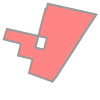

In [36]:
P = df_codigo_postal[df_codigo_postal['CP'] == 3104].geometry.values[0]
P

We add a temporary boolean feature that shows if the venue coordinates are inside the polygon or not. 

Geometric operations are supported in the `shapely` library.

In [37]:
prueba['Point'] = prueba.apply(lambda row: P.contains(shapely.geometry.Point(row['Venue Longitude'], row['Venue Latitude'])), axis=1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Let's take a look at the map with all the venues obtained from the query. 
Venues inside the polygon are marked in green and the outers are in red.

In [38]:
mex_geo = r'CDMX_CP.json'
lat = prueba['Venue Latitude'].mean()
lon = prueba['Venue Longitude'].mean()
benito_test = folium.Map(location=[lat, lon], zoom_start=15)

folium.Choropleth(geo_data = mex_geo,
                  fill_color = 'green', 
                  fill_opacity = 0.1,
                  line_color = '#322438',
                  line_opacity=1.0,
                  ).add_to(benito_test)

for lat, long, label, pp in zip(prueba['Venue Latitude'], prueba['Venue Longitude'], prueba['Venue'], prueba['Point']):
    #print(type(coords))
    folium.vector_layers.CircleMarker(
        [lat, long],
        popup = label,
        radius=3,
        color='green' if pp else 'red',
        fill=True,
        fill_color='white',
        fill_opacity=0.7
        ).add_to(benito_test)  
    
benito_test

Here's a screenshot of the map:

<img src="mapa_polygon_venues.png">

Now we apply the same procedure to our venue data to drop venues that do not correspond to the location of their query.

In [39]:
#Consulta el polygon, hace un Point de las coordenadas y evalua 
df_benito_venues['isPoint'] = df_benito_venues.apply(lambda row: df_codigo_postal[df_codigo_postal['CP'] == row['CP']].geometry.values[0].contains(shapely.geometry.Point(row['Venue Longitude'], row['Venue Latitude'])), axis=1)

In [40]:
df_benito_venues = df_benito_venues[df_benito_venues['isPoint'] == True]
df_benito_venues.drop(['isPoint'], axis=1, inplace=True)
print(df_benito_venues.shape)
df_benito_venues.head()

(1576, 5)


,CP,Venue,Venue Latitude,Venue Longitude,Venue Category
0,3000,La Casa de Toño,19.403356,-99.155597,Mexican Restaurant
1,3000,Krispy Kream Liverpool Delta,19.403544,-99.155079,Donut Shop
2,3000,Innovasport,19.402319,-99.154614,Sporting Goods Shop
3,3000,The Cheesecake Factory,19.402387,-99.155000,American Restaurant
4,3000,Häagen-Dazs,19.403396,-99.154356,Ice Cream Shop


Just for safety we save to a .csv file this filtered result.

In [41]:
#respaldar la consulta a Foursquare
df_benito_venues.to_csv("df_benito_venues_filtered.csv")

With this block we can retrieve the saved filtered results.

In [ ]:
#cargar la consulta previa en caso de que ya se haya hecho
df_benito_venues = pd.read_csv("df_benito_venues_filtered.csv", index_col=0)

In [42]:
len(df_benito_venues['Venue Category'].unique())

222

There are 222 different venue categories in Benito Juarez.

Here we apply a *one hot* transformation to the `Venue Category` feature

In [43]:
#Aplicar one-hot a los tipos de venue
df_benito_venue_ones = pd.get_dummies(df_benito_venues['Venue Category'], prefix="", prefix_sep="")

#Agregar la columna del codigo postal
df_benito_venue_ones['CP'] = df_benito_venues['CP']

print(df_benito_venue_ones.shape)
df_benito_venue_ones.head()

(1576, 223)


,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,...,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Veterinarian,Water Park,Wine Bar,Winery,Wings Joint,Women's Store,Yoga Studio,CP
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3000
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3000
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3000
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3000
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3000


In [ ]:
#df_benito_venues.groupby('CP').count()

Here we take the average per postal code for each venue category:

In [44]:
#Agrupamos los codigos postales tomando promedios en el resto de los atributos
df_benito_venue_group = df_benito_venue_ones.groupby('CP').mean().reset_index()
#df_benito_venue_group = df_benito_venue_ones.groupby('CP').sum().reset_index()
df_benito_venue_group.head()

,CP,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Trail,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Veterinarian,Water Park,Wine Bar,Winery,Wings Joint,Women's Store,Yoga Studio
0,3000,0.018519,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.018519,0.037037,0.000000
1,3010,0.000000,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
2,3020,0.015873,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.031746,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
3,3023,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.017241
4,3100,0.000000,0.0,0.0,0.0,0.021505,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.010753,0.010753,0.000000,0.010753


The next block contains a function that extracts the top venue categories for each location.

Some locations are small and didn't yield many results on our queries. 
Unavailable data is shown as N/A. 

In [45]:
def most_common_venues(row, tope):
    #regresa los venues mas populares
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    result = []
    for i in range(0,tope):
        if row_categories_sorted[i] > 0.0:
            result.append(row_categories_sorted.index.values[i])
        else:
            result.append('N/A')
            
    return result 

def top_venues(venue_data, location_data, num_top_venues=10):
    #returns the top venues in the dataframe
    indicators = ['st', 'nd', 'rd']
    #create columns according to number of top venues
    columns = ['CP', 'Asentamiento']
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))
    result = pd.DataFrame(columns=columns)
    result['CP'] = venue_data['CP']
    for ind in np.arange(venue_data.shape[0]):
        result.iloc[ind, 2:] = most_common_venues(venue_data.iloc[ind, :], num_top_venues)
        result.loc[ind, 'Asentamiento'] = location_data[location_data['CP'] == result.loc[ind, 'CP']]['Asentamiento'].values[0]
    return result


In [46]:
benito_venues_sorted = top_venues(df_benito_venue_group, df_benito)
benito_venues_sorted.head()

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,3000,Piedad Narvarte,Mexican Restaurant,Boutique,Clothing Store,Cosmetics Shop,Sporting Goods Shop,Sushi Restaurant,Donut Shop,Coffee Shop,Ice Cream Shop,Women's Store
1,3010,Atenor Salas,Argentinian Restaurant,Food Truck,Bar,N/A,N/A,N/A,N/A,N/A,N/A,N/A
2,3020,Narvarte Poniente,Coffee Shop,Mexican Restaurant,Seafood Restaurant,Gym / Fitness Center,Café,Ice Cream Shop,Taco Place,Pizza Place,Deli / Bodega,Restaurant
3,3023,Narvarte Oriente,Taco Place,Café,Mexican Restaurant,Coffee Shop,BBQ Joint,Burger Joint,Pizza Place,Brewery,Seafood Restaurant,Yoga Studio
4,3100,"Insurgentes San Borja, Del Valle Centro",Mexican Restaurant,Spa,Taco Place,Coffee Shop,Pharmacy,Italian Restaurant,Gym / Fitness Center,Café,Restaurant,Japanese Restaurant


Note that location *Atenor Salas 3010* has only 3 different venue categories.

### Clustering Benito Juárez

Here we attempt to cluster the locations with a K-means algorithm. 
We run an inertia test to choose the best parameter.

In [47]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = StandardScaler()

X_benito_venue = df_benito_venue_group.drop(['CP'], axis=1)
#X_benito_venue = scaler.fit_transform(X_benito_venue)

X_benito_venue.shape

(52, 222)

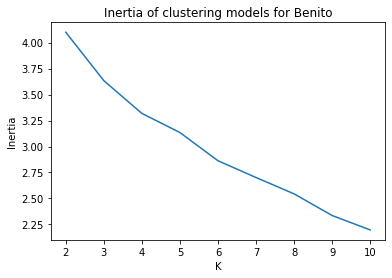

In [48]:
#prueba de inercia para K-means
inertia = []
for K in range(2,11):
    KMmodel = KMeans(n_clusters=K)
    KMmodel.fit(X_benito_venue)
    inertia.append(KMmodel.inertia_)
    
plt.plot(range(2,11),inertia)
plt.ylabel('Inertia')
plt.xlabel('K')
plt.title('Inertia of clustering models for Benito')
plt.show()

The elbow test for K-means is inconclusive.

Now we try a hierarchical clustering model and run a silhouette score test.

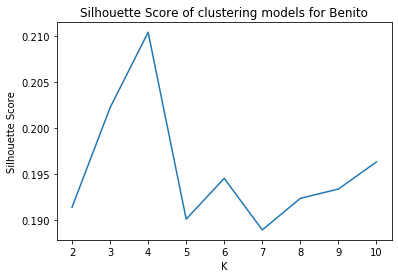

In [49]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

silhouette = []
for k in range(2,11):
    Hmodel = AgglomerativeClustering(n_clusters=k)
    Hmodel.fit(X_benito_venue)
    silhouette.append(silhouette_score(X_benito_venue, Hmodel.labels_))
    
plt.plot(range(2,11),silhouette)
plt.ylabel('Silhouette Score')
plt.xlabel('K')
plt.title('Silhouette Score of clustering models for Benito')
plt.show()

The silhouette test suggest 4 clusters for the hierarchical algorithm.

In [50]:
X_benito_venue = df_benito_venue_group.drop(['CP'], axis=1)

Hmodel = AgglomerativeClustering(n_clusters=4)
Hmodel.fit(X_benito_venue)

result = pd.DataFrame(df_benito_venue_group['CP'].values, columns=['CP'], index=df_benito_venue_group.index)
result['Cluster'] = Hmodel.labels_

In [51]:
benito_cluster_result = pd.merge(result, df_benito, on='CP', how='left')

lat = df_benito['m_latitude'].mean()
lon = df_benito['m_longitude'].mean()
benito_cluster_map = folium.Map(location=[lat, lon], zoom_start=13)

folium.Choropleth(geo_data = benito_geo,
                  data = benito_cluster_result,
                  columns = ['CP', 'Cluster'],
                  key_on='feature.properties.CP',
                  fill_color = 'YlGnBu', 
                  fill_opacity = 0.6,
                  line_color = '#322438',
                  line_opacity=1.0,
                  name = df_benito['Asentamiento']
                  ).add_to(benito_cluster_map)

rainbow = ['#3cdc8f', '#5db5ab', '#94e8ed', '#2e9fea', 
           '#3222a6', '#c35fdf', '#e5b1d5', '#913d53',
           '#d52e36', '#f09620', '#eadc0e', '#92f55d' ] 

for lab, nom, lat, lon in zip(benito_cluster_result['Cluster'], 
                         benito_cluster_result['Asentamiento'], 
                         benito_cluster_result['m_latitude'], 
                         benito_cluster_result['m_longitude']):
    folium.CircleMarker([lat, lon], 
                        radius = 5,
                        popup = "{}, C:{}".format(nom, lab),
                        color = rainbow[(lab)],
                        fill = True,
                        fill_color = rainbow[(lab)],
                        fill_opacity = 0.5,
                       ).add_to(benito_cluster_map)

benito_cluster_map

Here's a screenshot of the map:

<img src="mapa_benito_cluster.png">

There are two locations that got no venues in the query, they appear as black in the map.

### Insights on the clusters

Let's check the top 10 venue categories for each cluster

In [52]:
benito_result = pd.merge(benito_venues_sorted, benito_cluster_result[['CP', 'Cluster']], on='CP', how='left')

Cluster 1: 

Locations in this cluster have restaurants as their most popular venues, mostly mexican cuisine and taco places.

In [53]:
benito_result[benito_result['Cluster'] == 0]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
12,3303,Portales Norte,Mexican Restaurant,Taco Place,Seafood Restaurant,Food Truck,Flea Market,Spa,Southern / Soul Food Restaurant,Brewery,Restaurant,Comfort Food Restaurant,0
21,3440,Niños Héroes,Mexican Restaurant,Food Truck,Burger Joint,Taco Place,Seafood Restaurant,History Museum,Italian Restaurant,Food Stand,Road,Brewery,0
22,3500,Nativitas,Mexican Restaurant,Taco Place,Pizza Place,Dessert Shop,Bakery,Sporting Goods Shop,Burger Joint,Coffee Shop,Art Gallery,Hotel,0
25,3530,Villa de Cortes,Mexican Restaurant,Taco Place,Café,Dog Run,Ice Cream Shop,Sushi Restaurant,Tea Room,Dessert Shop,Miscellaneous Shop,Coffee Shop,0
26,3540,Del Carmen,Taco Place,Mexican Restaurant,English Restaurant,Sushi Restaurant,N/A,N/A,N/A,N/A,N/A,N/A,0
28,3560,Albert,Mexican Restaurant,Breakfast Spot,Food Stand,Martial Arts Dojo,N/A,N/A,N/A,N/A,N/A,N/A,0
29,3570,Portales Oriente,Pizza Place,Taco Place,Mexican Restaurant,Flea Market,N/A,N/A,N/A,N/A,N/A,N/A,0
30,3580,Miravalle,Mexican Restaurant,Taco Place,Dessert Shop,Restaurant,Liquor Store,N/A,N/A,N/A,N/A,N/A,0
35,3630,Independencia,Mexican Restaurant,Steakhouse,Taco Place,Gymnastics Gym,BBQ Joint,Candy Store,Restaurant,Farmers Market,Pet Store,Market,0
45,3820,8 de Agosto,Coffee Shop,Food Truck,Taco Place,N/A,N/A,N/A,N/A,N/A,N/A,N/A,0


Cluster 2:

This is the larger cluster. 
Locations in this cluster also have restaurants as their most popular venue. 
Restaurants on this locations are more diverse in their cuisine style than in the previous cluster.
We can also see some gym and spa venues ranking high in some of these locations.
There are also coffee shops, bakeries, ice cream and donut shops in many of the locations.
This relfects the lifestyle of this municipality, which is one of the most populated in Mexico City and with a lot of offices and residential buildings.

In [54]:
benito_result[benito_result['Cluster'] == 1]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
0,3000,Piedad Narvarte,Mexican Restaurant,Boutique,Clothing Store,Cosmetics Shop,Sporting Goods Shop,Sushi Restaurant,Donut Shop,Coffee Shop,Ice Cream Shop,Women's Store,1
2,3020,Narvarte Poniente,Coffee Shop,Mexican Restaurant,Seafood Restaurant,Gym / Fitness Center,Café,Ice Cream Shop,Taco Place,Pizza Place,Deli / Bodega,Restaurant,1
3,3023,Narvarte Oriente,Taco Place,Café,Mexican Restaurant,Coffee Shop,BBQ Joint,Burger Joint,Pizza Place,Brewery,Seafood Restaurant,Yoga Studio,1
4,3100,"Insurgentes San Borja, Del Valle Centro",Mexican Restaurant,Spa,Taco Place,Coffee Shop,Pharmacy,Italian Restaurant,Gym / Fitness Center,Café,Restaurant,Japanese Restaurant,1
5,3103,Del Valle Norte,Mexican Restaurant,Bakery,Seafood Restaurant,Coffee Shop,Taco Place,Restaurant,BBQ Joint,Spa,Salon / Barbershop,Health & Beauty Service,1
6,3104,Del Valle Sur,Coffee Shop,Gym / Fitness Center,Bakery,Convenience Store,Burger Joint,Restaurant,Health & Beauty Service,Mexican Restaurant,Pizza Place,Comfort Food Restaurant,1
7,3200,Tlacoquemécatl,Mexican Restaurant,Coffee Shop,Ice Cream Shop,Japanese Restaurant,Café,Park,Office,Taco Place,Seafood Restaurant,Italian Restaurant,1
8,3220,NaN,Vegetarian / Vegan Restaurant,Italian Restaurant,Flea Market,Sandwich Place,Ice Cream Shop,Food Truck,N/A,N/A,N/A,N/A,1
9,3230,Actipan,Cosmetics Shop,Coffee Shop,Italian Restaurant,Steakhouse,Other Great Outdoors,Pizza Place,Bistro,Flea Market,Shopping Mall,Health & Beauty Service,1
10,3240,Acacias,Bakery,Taco Place,Pharmacy,Gym,Seafood Restaurant,Park,Bistro,N/A,N/A,N/A,1


Cluster 3:

This cluster contains only one location. This location is an entire resdential zone. 

In [55]:
benito_result[benito_result['Cluster'] == 2]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
15,3320,Residencial Emperadores,Italian Restaurant,Restaurant,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,2


Cluster 4:

This cluster also has only one location. This location stands out because it has only 3 types of venues but none of them are the most common on clusters 1 and 2.

In [56]:
benito_result[benito_result['Cluster'] == 3]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
1,3010,Atenor Salas,Argentinian Restaurant,Food Truck,Bar,N/A,N/A,N/A,N/A,N/A,N/A,N/A,3


In [57]:
#benito_result[benito_result['Cluster'] == 4]

## Analyzing _Cuauhtémoc_

Let's do the same analysis for Cuauhtemoc.

In [58]:
df_cuauh = df_codigo_postal[df_codigo_postal['Municipio'] == 'Cuauhtémoc']
df_cuauh.shape

(43, 7)

There are 43 locations in Cuauhtémoc.

In [59]:
#guardar los polygonos en un archivo geojson
df_cuauh[['CP', 'geometry']].to_file("cuauh_CP.json", driver="GeoJSON")

In [60]:
lat = df_cuauh['m_latitude'].mean()
lon = df_cuauh['m_longitude'].mean()
cuauh_mapa = folium.Map(location=[lat, lon], zoom_start=13)

cuauh_geo = r'cuauh_CP.json'

folium.Choropleth(geo_data = cuauh_geo,
                  fill_color = 'green', 
                  fill_opacity = 0.1,
                  line_color = '#322438',
                  line_opacity=1.0,
                  name = df_cuauh['Asentamiento']
                  ).add_to(cuauh_mapa)

for coord, label in zip(df_cuauh['mean_coords'], df_cuauh['Asentamiento']):
    #print(type(coords))
    folium.vector_layers.CircleMarker(
        [coord[1], coord[0]],
        popup = label,
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7
        ).add_to(cuauh_mapa)  
    
cuauh_mapa

The following block contains the request to the Foursquare API.

In [ ]:
df_cuauh_venues = getNearbyVenues(names = df_cuauh['CP'],
                                   latitudes = df_cuauh['m_latitude'],
                                   longitudes = df_cuauh['m_longitude'])
print(df_cuauh_venues.shape)
df_cuauh_venues

We saved the result in a .csv file:

In [ ]:
#respaldar la consulta a Foursquare
df_cuauh_venues.to_csv("df_cuauh_venues.csv")

The next block loads the previously saved query to the Foursquare API.

In [61]:
#cargar la consulta previa en caso de que ya se haya hecho
df_cuauh_venues = pd.read_csv("df_cuauh_venues.csv", index_col=0)
#df_cuauh_venues.columns = ['CP', 'CP Latitude', 'CP Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
df_cuauh_venues

,CP,Venue,Venue Latitude,Venue Longitude,Venue Category
0,6000,Hotel Historico Central,19.433153,-99.138376,Hotel
1,6000,El Cardenal,19.433746,-99.135216,Mexican Restaurant
2,6000,Casino Español,19.433023,-99.137110,Spanish Restaurant
3,6000,Que Bo!,19.432771,-99.136166,Chocolate Shop
4,6000,Downtown México,19.432875,-99.136208,Hotel
...,...,...,...,...,...
3071,6740,Fonda Marina,19.412580,-99.159854,Seafood Restaurant
3072,6740,P.F. Chang’s,19.402712,-99.154914,Chinese Restaurant
3073,6740,Pizza Nostra,19.408280,-99.160098,Pizza Place
3074,6740,Café Punta Del Cielo,19.403207,-99.155059,Café


We remove all venue rows that don't agree with the polygon data.

In [62]:
#Consulta el polygon, hace un Point de las coordenadas y evalua 
df_cuauh_venues['isPoint'] = df_cuauh_venues.apply(lambda row: df_codigo_postal[df_codigo_postal['CP'] == row['CP']].geometry.values[0].contains(shapely.geometry.Point(row['Venue Longitude'], row['Venue Latitude'])), axis=1)

#seleccionar aquellos que si corresponden con su polygon
df_cuauh_venues = df_cuauh_venues[df_cuauh_venues['isPoint'] == True]
df_cuauh_venues.drop(['isPoint'], axis=1, inplace=True)

print(df_cuauh_venues.shape)
df_cuauh_venues.head()

(1534, 5)


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,CP,Venue,Venue Latitude,Venue Longitude,Venue Category
0,6000,Hotel Historico Central,19.433153,-99.138376,Hotel
1,6000,El Cardenal,19.433746,-99.135216,Mexican Restaurant
2,6000,Casino Español,19.433023,-99.137110,Spanish Restaurant
3,6000,Que Bo!,19.432771,-99.136166,Chocolate Shop
4,6000,Downtown México,19.432875,-99.136208,Hotel


from the 3076 results we are left with 1534 venues.

Again we save this filtered result in a .csv file:

In [63]:
#respaldar la consulta a Foursquare
df_cuauh_venues.to_csv("df_cuauh_venues_filtered.csv")

The next block loads the previously saved filtered result.

In [ ]:
#cargar la consulta previa en caso de que ya se haya hecho
df_cuauh_venues = pd.read_csv("df_cuauh_venues_filtered.csv", index_col=0)

As in the previous case, we apply a one-hot transformation to the Venue category feature:

In [64]:
#Aplicar one-hot a los tipos de venue
df_cuauh_venue_ones = pd.get_dummies(df_cuauh_venues['Venue Category'], prefix="", prefix_sep="")

#Agregar la columna del codigo postal
df_cuauh_venue_ones['CP'] = df_cuauh_venues['CP']

print(df_cuauh_venue_ones.shape)
df_cuauh_venue_ones.head()

(1534, 229)


,Advertising Agency,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Video Game Store,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Yucatecan Restaurant,CP
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6000
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6000
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6000
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6000
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6000


Now we take averages over each location:

In [65]:
#Agrupamos los codigos postales tomando promedios en el resto de los atributos
df_cuauh_venue_group = df_cuauh_venue_ones.groupby('CP').mean().reset_index()
df_cuauh_venue_group.head()

,CP,Advertising Agency,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,...,Veterinarian,Video Game Store,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Yucatecan Restaurant
0,6000,0.0,0.0,0.0,0.0,0.00,0.011765,0.035294,0.011765,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,6010,0.0,0.0,0.0,0.0,0.00,0.028571,0.028571,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6020,0.0,0.0,0.0,0.0,0.00,0.000000,0.035714,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,6030,0.0,0.0,0.0,0.0,0.02,0.000000,0.020000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6040,0.0,0.0,0.0,0.0,0.00,0.047619,0.000000,0.047619,0.047619,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Now we can visualize the top 10 categories for some locations.

In [66]:
cuauh_venues_sorted = top_venues(df_cuauh_venue_group, df_cuauh)
cuauh_venues_sorted.head()

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,6000,Centro (Área 1),Mexican Restaurant,Ice Cream Shop,Coffee Shop,Bakery,Café,Hotel,Boutique,Bar,Art Museum,Museum
1,6010,Centro (Área 2),Mexican Restaurant,Bar,Plaza,Bridal Shop,Beer Bar,Comedy Club,Bookstore,Brewery,Coffee Shop,Diner
2,6020,Centro (Área 3),Jewelry Store,Hostel,Bookstore,Concert Hall,Toy / Game Store,Restaurant,Museum,Beer Garden,Mexican Restaurant,Science Museum
3,6030,Tabacalera,Coffee Shop,Hotel,Mexican Restaurant,Restaurant,Taco Place,General Entertainment,Spanish Restaurant,Plaza,Bar,Dance Studio
4,6040,Centro (Área 4),Mexican Restaurant,Taco Place,Plaza,Café,Spanish Restaurant,Restaurant,Sports Club,Library,Beer Garden,Food


Let's try a K-means model for clustering

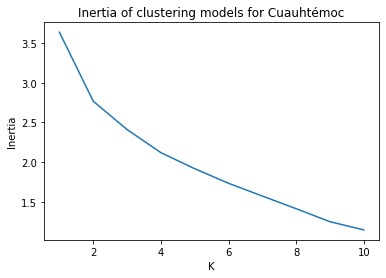

In [67]:
#Clustering Cuauhtémoc
X_cuauh_venue = df_cuauh_venue_group.drop(['CP'], axis=1)

inertia = []
for K in range(1,11):
    KMmodel = KMeans(n_clusters=K, n_init=15)
    KMmodel.fit(X_cuauh_venue)
    inertia.append(KMmodel.inertia_)
    
plt.plot(range(1,11),inertia)
plt.ylabel('Inertia')
plt.xlabel('K')
plt.title('Inertia of clustering models for Cuauhtémoc')
plt.show()

The elbow test suggest a value of K between 2 and 4, but it's not conclusive. 

Let's check a slihoutette test for a hierarchical clustering model.

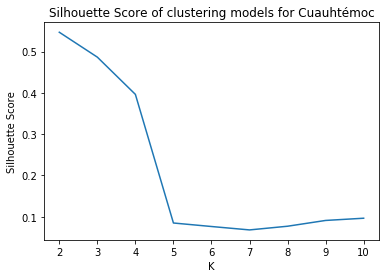

In [68]:
silhouette = []
for k in range(2,11):
    Hmodel = AgglomerativeClustering(n_clusters=k)
    Hmodel.fit(X_cuauh_venue)
    silhouette.append(silhouette_score(X_cuauh_venue, Hmodel.labels_))
    
plt.plot(range(2,11),silhouette)
plt.ylabel('Silhouette Score')
plt.xlabel('K')
plt.title('Silhouette Score of clustering models for Cuauhtémoc')
plt.show()

Both tests suggest a parameter between 2 and 4.
Let's try K=3 

In [69]:
#Clustering Cuauhtémoc
#K-means model
#KMmodel = KMeans(n_clusters=3, n_init=15)
#KMmodel.fit(X_cuauh_venue)

#Hierarchical clustering
Hmodel = AgglomerativeClustering(n_clusters=3)
Hmodel.fit(X_cuauh_venue)

result = pd.DataFrame(df_cuauh_venue_group['CP'].values, columns=['CP'], index=df_cuauh_venue_group.index)
#result['Cluster'] = KMmodel.labels_
result['Cluster'] = Hmodel.labels_

cuauh_cluster_result = pd.merge(result, df_cuauh, on='CP', how='left')

lat = df_cuauh['m_latitude'].mean()
lon = df_cuauh['m_longitude'].mean()
cuauh_cluster_map = folium.Map(location=[lat, lon], zoom_start=13)

rainbow = ['#3222a6', '#c35fdf', '#e5b1d5', '#913d53', 
           '#d52e36', '#f09620', '#eadc0e', '#92f55d', 
           '#3cdc8f', '#5db5ab', '#94e8ed', '#2e9fea'] 

folium.Choropleth(geo_data = cuauh_geo,
                  data = cuauh_cluster_result,
                  columns = ['CP', 'Cluster'],
                  key_on='feature.properties.CP',
                  fill_color = 'YlGnBu', 
                  fill_opacity = 0.6,
                  line_color = '#322438',
                  line_opacity=1.0,
                  name = df_cuauh['Asentamiento']
                  ).add_to(cuauh_cluster_map)

for lab, nom, lat, lon in zip(cuauh_cluster_result['Cluster'], 
                         cuauh_cluster_result['Asentamiento'], 
                         cuauh_cluster_result['m_latitude'], 
                         cuauh_cluster_result['m_longitude']):
    folium.CircleMarker([lat, lon], 
                        radius = 5,
                        popup = "{}, C:{}".format(nom, lab),
                        color = rainbow[int(lab)],
                        fill = True,
                        fill_color = rainbow[int(lab)],
                        fill_opacity = 0.5,
                       ).add_to(cuauh_cluster_map)

cuauh_cluster_map

Here's a screenshot of the map: 

<img src="mapa_cuauh_cluster.png">

In [70]:
cuauh_result = pd.merge(cuauh_venues_sorted, cuauh_cluster_result[['CP', 'Cluster']], on='CP', how='left')

Cluster 1:

This cluster includes most of the locations in Cuauhtémoc. This municipality includes the main square of Mexico City and surroundings. The vast diversity of venues in this municipality shows in the features of this cluster.


In [71]:
cuauh_result[cuauh_result['Cluster'] == 0]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
0,6000,Centro (Área 1),Mexican Restaurant,Ice Cream Shop,Coffee Shop,Bakery,Café,Hotel,Boutique,Bar,Art Museum,Museum,0
1,6010,Centro (Área 2),Mexican Restaurant,Bar,Plaza,Bridal Shop,Beer Bar,Comedy Club,Bookstore,Brewery,Coffee Shop,Diner,0
2,6020,Centro (Área 3),Jewelry Store,Hostel,Bookstore,Concert Hall,Toy / Game Store,Restaurant,Museum,Beer Garden,Mexican Restaurant,Science Museum,0
3,6030,Tabacalera,Coffee Shop,Hotel,Mexican Restaurant,Restaurant,Taco Place,General Entertainment,Spanish Restaurant,Plaza,Bar,Dance Studio,0
4,6040,Centro (Área 4),Mexican Restaurant,Taco Place,Plaza,Café,Spanish Restaurant,Restaurant,Sports Club,Library,Beer Garden,Food,0
5,6050,Centro (Área 5),Mexican Restaurant,Ice Cream Shop,Exhibit,Bar,Hotel,Bookstore,Restaurant,Coffee Shop,Plaza,Art Museum,0
6,6060,Centro (Área 6),Historic Site,Museum,Restaurant,Clothing Store,Art Museum,Department Store,Plaza,Taco Place,Mexican Restaurant,History Museum,0
7,6070,Centro (Área 7),Mexican Restaurant,Bakery,Taco Place,Deli / Bodega,Bar,Café,Restaurant,Vegetarian / Vegan Restaurant,Farmers Market,Seafood Restaurant,0
8,6080,Centro (Área 8),Mexican Restaurant,Café,Taco Place,Historic Site,Arts & Crafts Store,Eye Doctor,Spa,Restaurant,Plaza,Pedestrian Plaza,0
9,6090,Centro (Área 9),Taco Place,Martial Arts Dojo,Art Gallery,Seafood Restaurant,Middle Eastern Restaurant,Restaurant,Coffee Shop,Mexican Restaurant,Fried Chicken Joint,Paper / Office Supplies Store,0


Cluster 2: 

This cluster consists of two postal codes with only two types of venues. That lack of variety is what sets it apart from the previous cluster.

In [72]:
cuauh_result[cuauh_result['Cluster'] == 1]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
30,6780,Buenos Aires,Convenience Store,Hotel Bar,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,1
34,6850,Asturias,Convenience Store,Argentinian Restaurant,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,1


Cluster 3:

This last cluster, like the second one, consists of a postal code with too few venue types.

In [73]:
cuauh_result[cuauh_result['Cluster'] == 2]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
36,6870,Paulino Navarro,Burrito Place,Mexican Restaurant,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,2


In [75]:
#cuauh_result[cuauh_result['Cluster'] == 3]

### Analyzing Coyoacán

The next municipality to be analyzed is _Coyoacán_.

In [76]:
df_coyoacan = df_codigo_postal[df_codigo_postal['Municipio'] == 'Coyoacán']
df_coyoacan.shape

(97, 7)

In [77]:
#guardar los polygonos en un archivo geojson
df_coyoacan[['CP', 'geometry']].to_file("coyoacan_CP.json", driver="GeoJSON")

In [78]:
lat = df_coyoacan['m_latitude'].mean()
lon = df_coyoacan['m_longitude'].mean()

coyoacan_mapa = folium.Map(location=[lat, lon], zoom_start=13)
coyoacan_geo = r'coyoacan_CP.json'

folium.Choropleth(geo_data = coyoacan_geo,
                  fill_color = 'green', 
                  fill_opacity = 0.1,
                  line_color = '#322438',
                  line_opacity=1.0,
                  name = df_cuauh['Asentamiento']
                  ).add_to(coyoacan_mapa)

for coord, label in zip(df_coyoacan['mean_coords'], df_coyoacan['Asentamiento']):
    #print(type(coords))
    folium.vector_layers.CircleMarker(
        [coord[1], coord[0]],
        popup = label,
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7
        ).add_to(coyoacan_mapa)  
    
coyoacan_mapa

The next blocks contain the request to the Foursquare API and the back up of the results. 

In [ ]:
df_coyoacan_venues = getNearbyVenues(names = df_coyoacan['CP'],
                                     latitudes = df_coyoacan['m_latitude'],
                                     longitudes = df_coyoacan['m_longitude'])
print(df_coyoacan_venues.shape)
df_coyoacan_venues

In [ ]:
#respaldar la consulta a Foursquare
df_coyoacan_venues.to_csv("df_coyoacan_venues.csv")

This block loads the previously requested data.

In [79]:
#cargar la consulta previa en caso de que ya se haya hecho
df_coyoacan_venues = pd.read_csv("df_coyoacan_venues.csv", index_col=0)
df_coyoacan_venues

,CP,Venue,Venue Latitude,Venue Longitude,Venue Category
0,4000,Fortunata Café,19.346784,-99.160447,Coffee Shop
1,4000,Café Avellaneda,19.348300,-99.160814,Café
2,4000,Ristorante Amarcord,19.347275,-99.162597,Italian Restaurant
3,4000,Coyoacán,19.349643,-99.163208,Neighborhood
4,4000,Fuente de los Coyotes,19.349150,-99.163446,Historic Site
...,...,...,...,...,...
5357,4908,Parque Los Coyotitos,19.324558,-99.109445,Park
5358,4908,Mercado Carmen Serdan,19.320477,-99.105963,Market
5359,4908,Las nuevas Michelocas,19.327691,-99.099765,Brewery
5360,4908,Tacos la curva,19.325239,-99.098747,Taco Place


Here we filter out the venues that lie outside their corresponding polygon.

In [80]:
#Consulta el polygon, hace un Point de las coordenadas y evalua 
df_coyoacan_venues['isPoint'] = df_coyoacan_venues.apply(lambda row: df_codigo_postal[df_codigo_postal['CP'] == row['CP']].geometry.values[0].contains(shapely.geometry.Point(row['Venue Longitude'], row['Venue Latitude'])), axis=1)

#seleccionar aquellos que si corresponden con su polygon
df_coyoacan_venues = df_coyoacan_venues[df_coyoacan_venues['isPoint'] == True]
df_coyoacan_venues.drop(['isPoint'], axis=1, inplace=True)

print(df_coyoacan_venues.shape)
df_coyoacan_venues.head()

(1594, 5)


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,CP,Venue,Venue Latitude,Venue Longitude,Venue Category
0,4000,Fortunata Café,19.346784,-99.160447,Coffee Shop
1,4000,Café Avellaneda,19.348300,-99.160814,Café
2,4000,Ristorante Amarcord,19.347275,-99.162597,Italian Restaurant
3,4000,Coyoacán,19.349643,-99.163208,Neighborhood
4,4000,Fuente de los Coyotes,19.349150,-99.163446,Historic Site


Here we save a backup of the filtered data to a .csv file

In [81]:
#respaldar la consulta a Foursquare
df_coyoacan_venues.to_csv("df_coyoacan_venues_filtered.csv")

In [ ]:
#cargar la consulta previa en caso de que ya se haya hecho
df_coyoacan_venues = pd.read_csv("df_coyoacan_venues_filtered.csv", index_col=0)

Here we apply a one-hot tranformation to the Venue Category feature and average per postal code.
We take a look to the data with the top 10 function from before.

In [82]:
#Aplicar one-hot a los tipos de venue
df_coyoacan_venue_ones = pd.get_dummies(df_coyoacan_venues['Venue Category'], prefix="", prefix_sep="")

#Agregar la columna del codigo postal
df_coyoacan_venue_ones['CP'] = df_coyoacan_venues['CP']

#print(df_coyoacan_venue_ones.shape)
#df_coyoacan_venue_ones.head()

#Agrupamos los codigos postales tomando promedios en el resto de los atributos
df_coyoacan_venue_group = df_coyoacan_venue_ones.groupby('CP').mean().reset_index()
#df_coyoacan_venue_group.head()

#Encontrar el top 10 de cada zona
coyoacan_venues_sorted = top_venues(df_coyoacan_venue_group, df_coyoacan)
coyoacan_venues_sorted.head()

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4000,Villa Coyoacán,Bar,Mexican Restaurant,Ice Cream Shop,Coffee Shop,Café,Italian Restaurant,Plaza,Taco Place,Vegetarian / Vegan Restaurant,Pizza Place
1,4010,Santa Catarina,Coffee Shop,Bakery,Mexican Restaurant,Ice Cream Shop,Breakfast Spot,Restaurant,Plaza,Road,Liquor Store,Snack Place
2,4020,La Concepción,Mexican Restaurant,Italian Restaurant,Dessert Shop,Pizza Place,Argentinian Restaurant,Breakfast Spot,Plaza,Food Truck,Park,Coffee Shop
3,4030,San Lucas,Bar,Argentinian Restaurant,Restaurant,Italian Restaurant,Café,Liquor Store,Performing Arts Venue,Hospital,Gym,Ice Cream Shop
4,4040,Parque San Andrés,Taco Place,Mexican Restaurant,Pharmacy,Hotel,Vegetarian / Vegan Restaurant,Restaurant,Café,Camera Store,Food,Donut Shop


Like in the previous cases, we'll try two clustering models.

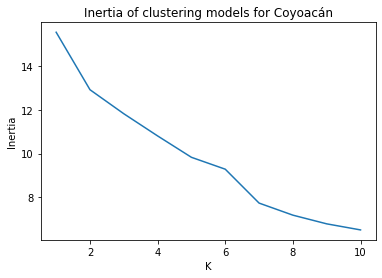

In [83]:
#Clustering Coyoacán
X_coyoacan_venue = df_coyoacan_venue_group.drop(['CP'], axis=1)

inertia = []
for K in range(1,11):
    KMmodel = KMeans(n_clusters=K, n_init=15)
    KMmodel.fit(X_coyoacan_venue)
    inertia.append(KMmodel.inertia_)
    
plt.plot(range(1,11),inertia)
plt.ylabel('Inertia')
plt.xlabel('K')
plt.title('Inertia of clustering models for Coyoacán')
plt.show()

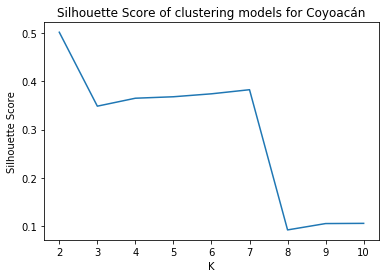

In [84]:
silhouette = []
for k in range(2,11):
    Hmodel = AgglomerativeClustering(n_clusters=k)
    Hmodel.fit(X_coyoacan_venue)
    silhouette.append(silhouette_score(X_coyoacan_venue, Hmodel.labels_))
    
plt.plot(range(2,11),silhouette)
plt.ylabel('Silhouette Score')
plt.xlabel('K')
plt.title('Silhouette Score of clustering models for Coyoacán')
plt.show()

The test for K-means is inconclusive and the silhouette score suggest a parameter K=2.

In [97]:
Kclusters=2
#K-means model
#KMmodel = KMeans(n_clusters=Kclusters, n_init=15)
#KMmodel.fit(X_coyoacan_venue)

#Hierarchical clustering
Hmodel = AgglomerativeClustering(n_clusters=Kclusters)
Hmodel.fit(X_coyoacan_venue)

result = pd.DataFrame(df_coyoacan_venue_group['CP'].values, columns=['CP'], index=df_coyoacan_venue_group.index)
result['Cluster'] = Hmodel.labels_

coyoacan_cluster_result = pd.merge(result, df_coyoacan, on='CP', how='left')

lat = df_coyoacan['m_latitude'].mean()
lon = df_coyoacan['m_longitude'].mean()

coyoacan_cluster_map = folium.Map(location=[lat, lon], zoom_start=13)

rainbow = ['#f09620', '#eadc0e', '#92f55d', '#3cdc8f', '#5db5ab', '#94e8ed', '#2e9fea', '#3222a6', '#c35fdf', '#e5b1d5', '#913d53', '#d52e36' ] 

folium.Choropleth(geo_data = coyoacan_geo,
                  data = coyoacan_cluster_result,
                  columns = ['CP', 'Cluster'],
                  key_on='feature.properties.CP',
                  fill_color = 'YlGnBu', 
                  fill_opacity = 0.7,
                  line_color = '#322438',
                  line_opacity=1.0,
                  name = df_cuauh['Asentamiento']
                  ).add_to(coyoacan_cluster_map)

for lab, nom, lat, lon in zip(coyoacan_cluster_result['Cluster'], 
                              coyoacan_cluster_result['Asentamiento'], 
                              coyoacan_cluster_result['m_latitude'], 
                              coyoacan_cluster_result['m_longitude']):
    folium.CircleMarker([lat, lon], 
                        radius = 5,
                        popup = "{}, C:{}".format(nom, lab),
                        color = rainbow[lab-1],
                        fill = True,
                        fill_color = rainbow[lab-1],
                        fill_opacity = 0.5,
                       ).add_to(coyoacan_cluster_map)

coyoacan_cluster_map

Here's a screenshot of the map:

<img src="mapa_coyoacan_cluster.png">

In [98]:
coyoacan_result = pd.merge(coyoacan_venues_sorted, coyoacan_cluster_result[['CP', 'Cluster']], on='CP', how='left')

Cluster 1:

This cluster contains most of the locations in Coyoacán.
The type of venues in this cluster are diverese with Restaurants and Taco places as their most popular.

In [99]:
coyoacan_result[coyoacan_result['Cluster'] == 0]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
0,4000,Villa Coyoacán,Bar,Mexican Restaurant,Ice Cream Shop,Coffee Shop,Café,Italian Restaurant,Plaza,Taco Place,Vegetarian / Vegan Restaurant,Pizza Place,0
1,4010,Santa Catarina,Coffee Shop,Bakery,Mexican Restaurant,Ice Cream Shop,Breakfast Spot,Restaurant,Plaza,Road,Liquor Store,Snack Place,0
2,4020,La Concepción,Mexican Restaurant,Italian Restaurant,Dessert Shop,Pizza Place,Argentinian Restaurant,Breakfast Spot,Plaza,Food Truck,Park,Coffee Shop,0
3,4030,San Lucas,Bar,Argentinian Restaurant,Restaurant,Italian Restaurant,Café,Liquor Store,Performing Arts Venue,Hospital,Gym,Ice Cream Shop,0
4,4040,Parque San Andrés,Taco Place,Mexican Restaurant,Pharmacy,Hotel,Vegetarian / Vegan Restaurant,Restaurant,Café,Camera Store,Food,Donut Shop,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,4940,Los Sauces,Health & Beauty Service,Soccer Field,Mexican Restaurant,Italian Restaurant,Park,Coffee Shop,Clothing Store,Donut Shop,Soccer Stadium,Sporting Goods Shop,0
77,4950,El Mirador,Convenience Store,Farmers Market,Gym / Fitness Center,Coffee Shop,N/A,N/A,N/A,N/A,N/A,N/A,0
78,4960,Villa Quietud,Burger Joint,Housing Development,Gym / Fitness Center,Park,College Quad,Mexican Restaurant,Athletics & Sports,N/A,N/A,N/A,0
79,4970,Haciendas de Coyoacán,Pizza Place,Mexican Restaurant,Burger Joint,Bakery,Taco Place,Ice Cream Shop,Gym / Fitness Center,Convenience Store,Music Venue,Sushi Restaurant,0


Cluster 2:

This cluster contains three (unnamed) locations with their only venues being Taco places.
After looking them up in the map we see this locations are middle class residential buildings.

In [100]:
coyoacan_result[coyoacan_result['Cluster'] == 1]

,CP,Asentamiento,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster
20,4337,NaN,Taco Place,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,1
23,4359,NaN,Taco Place,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,1
56,4738,NaN,Taco Place,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,1
